In [1]:
import numpy as np
import pandas as pd
import altair as alt
import re
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('bollywood_data.csv')
df

,title_x,imdb_id,poster_path,wiki_link,title_y,original_title,is_adult,year_of_release,runtime,genres,imdb_rating,imdb_votes,story,summary,tagline,actors,wins_nominations,release_date,budget,box office
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,8.4,35112,Divided over five chapters the film chronicles...,Indian army special forces execute a covert op...,NaN,Vicky Kaushal|Paresh Rawal|Mohit Raina|Yami Ga...,4 wins,11 January 2019 (USA),25.00,342.06
1,Battalion 609,tt9472208,NaN,https://en.wikipedia.org/wiki/Battalion_609,Battalion 609,Battalion 609,0,2019,131,War,4.1,73,The story revolves around a cricket match betw...,The story of Battalion 609 revolves around a c...,NaN,Vicky Ahuja|Shoaib Ibrahim|Shrikant Kamat|Elen...,NaN,11 January 2019 (India),0.01,2.70
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,6.1,5549,Based on the memoir by Indian policy analyst S...,Explores Manmohan Singh's tenure as the Prime ...,NaN,Anupam Kher|Akshaye Khanna|Aahana Kumra|Atul S...,NaN,11 January 2019 (USA),18.00,22.65
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,6.0,1891,The movie focuses on existing malpractices in ...,The movie focuses on existing malpractices in ...,NaN,Emraan Hashmi|Shreya Dhanwanthary|Snighdadeep ...,NaN,18 January 2019 (USA),20.00,10.54
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,7.3,280,While gay rights and marriage equality has bee...,Under the 'Evening Shadows' truth often plays ...,NaN,Mona Ambegaonkar|Ananth Narayan Mahadevan|Deva...,17 wins & 1 nomination,11 January 2019 (India),2.75,2.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4324,Samadhi (1950 film),tt0268614,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Samadhi_(1950_film),Samadhi,Samadhi,0,1950,165,Drama,6.1,21,The story is based on the true incident at INA...,The story is based on the true incident at INA...,NaN,Ashok Kumar|Nalini Jaywant|Kuldip Kaur|Shyam|M...,NaN,NaN,NaN,NaN
4325,Sangram (1950 film),tt0244182,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sangram_(1950_film),Sangram,Sangram,0,1950,139,Drama,6.2,20,After the death of his wife a policeman fails ...,After the death of his wife a policeman fails ...,NaN,Ashok Kumar|Nalini Jaywant|Nawab|Sajjan|Tiwari...,NaN,NaN,NaN,NaN
4326,Sargam (1950 film),tt0269826,NaN,https://en.wikipedia.org/wiki/Sargam_(1950_film),Melody,Sargam,0,1950,135,Drama|Family,6.8,21,NaN,Add a Plot »,NaN,Raj Kapoor|Rehana|Om Prakash|David Abraham|Rad...,NaN,4 February 1957 (Iran),NaN,NaN
4327,Sheesh Mahal (1950 film),tt0243555,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sheesh_Mahal_(19...,Sheesh Mahal,Sheesh Mahal,0,1950,144,Drama,7.0,13,Thakur Jaspal Singh lives in the prestigious a...,Thakur Jaspal Singh lives in the prestigious a...,NaN,Sohrab Modi|Naseem Banu|Pushpa Hans|Nigar Sult...,NaN,NaN,NaN,NaN


In [3]:
#Droping columns which are not useful
df.drop(['title_x','title_y', 'imdb_id', 'poster_path', 'wiki_link', 'is_adult', 'tagline', 'release_date'], axis=1)

,original_title,year_of_release,runtime,genres,imdb_rating,imdb_votes,story,summary,actors,wins_nominations,budget,box office
0,Uri: The Surgical Strike,2019,138,Action|Drama|War,8.4,35112,Divided over five chapters the film chronicles...,Indian army special forces execute a covert op...,Vicky Kaushal|Paresh Rawal|Mohit Raina|Yami Ga...,4 wins,25.00,342.06
1,Battalion 609,2019,131,War,4.1,73,The story revolves around a cricket match betw...,The story of Battalion 609 revolves around a c...,Vicky Ahuja|Shoaib Ibrahim|Shrikant Kamat|Elen...,NaN,0.01,2.70
2,The Accidental Prime Minister,2019,112,Biography|Drama,6.1,5549,Based on the memoir by Indian policy analyst S...,Explores Manmohan Singh's tenure as the Prime ...,Anupam Kher|Akshaye Khanna|Aahana Kumra|Atul S...,NaN,18.00,22.65
3,Why Cheat India,2019,121,Crime|Drama,6.0,1891,The movie focuses on existing malpractices in ...,The movie focuses on existing malpractices in ...,Emraan Hashmi|Shreya Dhanwanthary|Snighdadeep ...,NaN,20.00,10.54
4,Evening Shadows,2018,102,Drama,7.3,280,While gay rights and marriage equality has bee...,Under the 'Evening Shadows' truth often plays ...,Mona Ambegaonkar|Ananth Narayan Mahadevan|Deva...,17 wins & 1 nomination,2.75,2.50
...,...,...,...,...,...,...,...,...,...,...,...,...
4324,Samadhi,1950,165,Drama,6.1,21,The story is based on the true incident at INA...,The story is based on the true incident at INA...,Ashok Kumar|Nalini Jaywant|Kuldip Kaur|Shyam|M...,NaN,NaN,NaN
4325,Sangram,1950,139,Drama,6.2,20,After the death of his wife a policeman fails ...,After the death of his wife a policeman fails ...,Ashok Kumar|Nalini Jaywant|Nawab|Sajjan|Tiwari...,NaN,NaN,NaN
4326,Sargam,1950,135,Drama|Family,6.8,21,NaN,Add a Plot »,Raj Kapoor|Rehana|Om Prakash|David Abraham|Rad...,NaN,NaN,NaN
4327,Sheesh Mahal,1950,144,Drama,7.0,13,Thakur Jaspal Singh lives in the prestigious a...,Thakur Jaspal Singh lives in the prestigious a...,Sohrab Modi|Naseem Banu|Pushpa Hans|Nigar Sult...,NaN,NaN,NaN


In [4]:
#Renaming columns for ease of references
df = df.rename(columns={'original_title':'title', 'year_of_release':'year', 'imdb_rating':'rating', 'imdb_rating':'rating', 'imdb_votes':'votes', 'wins_nominations':'awards'})
df

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,rating,votes,story,summary,tagline,actors,awards,release_date,budget,box office
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,8.4,35112,Divided over five chapters the film chronicles...,Indian army special forces execute a covert op...,NaN,Vicky Kaushal|Paresh Rawal|Mohit Raina|Yami Ga...,4 wins,11 January 2019 (USA),25.00,342.06
1,Battalion 609,tt9472208,NaN,https://en.wikipedia.org/wiki/Battalion_609,Battalion 609,Battalion 609,0,2019,131,War,4.1,73,The story revolves around a cricket match betw...,The story of Battalion 609 revolves around a c...,NaN,Vicky Ahuja|Shoaib Ibrahim|Shrikant Kamat|Elen...,NaN,11 January 2019 (India),0.01,2.70
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,6.1,5549,Based on the memoir by Indian policy analyst S...,Explores Manmohan Singh's tenure as the Prime ...,NaN,Anupam Kher|Akshaye Khanna|Aahana Kumra|Atul S...,NaN,11 January 2019 (USA),18.00,22.65
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,6.0,1891,The movie focuses on existing malpractices in ...,The movie focuses on existing malpractices in ...,NaN,Emraan Hashmi|Shreya Dhanwanthary|Snighdadeep ...,NaN,18 January 2019 (USA),20.00,10.54
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,7.3,280,While gay rights and marriage equality has bee...,Under the 'Evening Shadows' truth often plays ...,NaN,Mona Ambegaonkar|Ananth Narayan Mahadevan|Deva...,17 wins & 1 nomination,11 January 2019 (India),2.75,2.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4324,Samadhi (1950 film),tt0268614,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Samadhi_(1950_film),Samadhi,Samadhi,0,1950,165,Drama,6.1,21,The story is based on the true incident at INA...,The story is based on the true incident at INA...,NaN,Ashok Kumar|Nalini Jaywant|Kuldip Kaur|Shyam|M...,NaN,NaN,NaN,NaN
4325,Sangram (1950 film),tt0244182,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sangram_(1950_film),Sangram,Sangram,0,1950,139,Drama,6.2,20,After the death of his wife a policeman fails ...,After the death of his wife a policeman fails ...,NaN,Ashok Kumar|Nalini Jaywant|Nawab|Sajjan|Tiwari...,NaN,NaN,NaN,NaN
4326,Sargam (1950 film),tt0269826,NaN,https://en.wikipedia.org/wiki/Sargam_(1950_film),Melody,Sargam,0,1950,135,Drama|Family,6.8,21,NaN,Add a Plot »,NaN,Raj Kapoor|Rehana|Om Prakash|David Abraham|Rad...,NaN,4 February 1957 (Iran),NaN,NaN
4327,Sheesh Mahal (1950 film),tt0243555,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sheesh_Mahal_(19...,Sheesh Mahal,Sheesh Mahal,0,1950,144,Drama,7.0,13,Thakur Jaspal Singh lives in the prestigious a...,Thakur Jaspal Singh lives in the prestigious a...,NaN,Sohrab Modi|Naseem Banu|Pushpa Hans|Nigar Sult...,NaN,NaN,NaN,NaN


#Cleaning process

Awards columns has both awards and nominations. We will separate them to wins and nominations and clean and strip them to be
useful for analysis later on.

Runtime columns has some movies for which duration is not recorded we will forward fill them. This is not the right way to fill
but finding movie duration for each missing entry is not worth it. There are better ways to impute missing values. 

Actors column has list of all the actors from the movie. We are going to take the first actor from each entry as we will only
explore dataset in regards to lead actor.

We are going to take first genre that describe movie as main genre. Rest we will discard. Also, there we few genres which had
very low count, we will not use those in analysis.

Lastly we will drop duplicates from the dataset




In [5]:
#Data cleaning
df['awards'] = df['awards'].apply(lambda x : re.sub(r'[A-Za-z]', '', str(x)))

df[['wins', 'nominations']] = df.awards.str.split('&', expand= True)

df['wins'] = df['wins'].str.strip()
df['wins'] = df['wins'].apply(lambda x: 0 if x=='' else x)
df['wins'] = df['wins'].replace(np.nan, 0)
df['wins'] = df['wins'].astype(int)

df['runtime'] = df['runtime'].replace('\\N', np.nan)
df['runtime'] = df['runtime'].ffill()
df['runtime'] = df['runtime'].astype(int)
df = df[df['runtime'] >= 60]

actors = df.actors.str.split('|', expand=True)
df['lead_actor'] = actors[0]

df[['genre', 'genre2', 'genre3']] = df.genres.str.split("|", expand=True)
df.drop(['genres', 'awards', 'actors', 'genre2', 'genre3', 'nominations'], axis=1)
minor_genre_list = ['Animation', 'Documentary', 'History', 'Music', 'War', 'Sci-Fi', 'Sport']
df = df[~df['genre'].isin(minor_genre_list)]

df = df.drop_duplicates()

<ipython-input-5-e26d26984324>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lead_actor'] = actors[0]
C:\Users\user\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


# Movie released in each year

Remove it

In [6]:
alt.Chart(df, title='Bollywood movie release over the years').mark_circle(opacity=0.8).transform_window(
    id = 'rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1951, 2019])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip=['title', 'year', 'rating'],
    color = 'genre'
).properties(height=600, width=800)

alt.Chart(...)

It looks like Drama has dominated bollywood. But, Action movies have gained momentum since 1980 and comedy from early 2000. Also, it looks like thrillers are in trend right now.

# How many movies of each genre were made each year

In [7]:
temp1 = df.groupby(['genre','year']).size().reset_index(name = 'count')
alt.Chart(temp1, title='Bollywood mocies genre over the years').mark_bar(opacity=0.8).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1952, 2019])),
    alt.Y('count', stack='zero'),
    color='genre',
    tooltip=['genre']
).properties(height=500, width=800)

alt.Chart(...)


We can see from the chart above that till 1970s drama dominated bollywood.

Action movies dominated from 1980 to 2000

From early 2000 comedy movies started gaining catching up to frama and action

From 2000 to 2010 some of the best comedy movies were made like hera pheri.

Romantic movies count have been low compared to drama, action, or comedy.
Romntic movies although low in count have been big success in bollywood



# Movies that won awards in bollywood

Change graph type to bar as shown above

In [8]:
winners = df[df['wins'] != 0]
alt.Chart(winners, title='Awards winning over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip = ['title', 'year'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

Drama movies dominated the awards till late 80s.

After 1990s different differnet genres win awards

We can clearly see that bollywood has started giving too many awards since 2000

# Movies that won multiple awards

In [9]:
#we will look at the movies that have more than 5 awards

alt.Chart(winners[winners['wins']>5], title='Multiple award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title','year'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

# Movies that have won more than 5 awards on the basis of rating and votes

In [10]:
#we will look at the movies that have more than 5 awards

alt.Chart(winners[winners['wins']>5], title='Multiple award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('votes', scale=alt.Scale(type='log', domain=[10, 1000000])),
    tooltip=['title','year', 'votes'],
    color='genre'
).properties(height=600, width=800)

alt.Chart(...)

From this graph we can clearly see that lots of movies from early bollywood era haven't been rate by many users. 

Bollywood movies have more than 1000000 ratings

From this graph we can clearly see that in 2008, 3 idiots movie got highest number of votes(300K).

# Lead actors who appeared in award winning movie

In [11]:
temp2 = winners.lead_actor.value_counts().head(10).rename_axis('actor').reset_index(name='appearences')
alt.Chart(temp2, title='Lead actor with most appearences in award winning movies').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle=-45)),
    alt.Y("appearences")
).properties(width=600)

alt.Chart(...)

In [12]:
df

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,awards,release_date,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,...,4,11 January 2019 (USA),25.00,342.06,4,None,Vicky Kaushal,Action,Drama,War
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,,11 January 2019 (USA),18.00,22.65,0,None,Anupam Kher,Biography,Drama,None
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,...,,18 January 2019 (USA),20.00,10.54,0,None,Emraan Hashmi,Crime,Drama,None
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,...,17 & 1,11 January 2019 (India),2.75,2.50,17,1,Mona Ambegaonkar,Drama,None,None
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,...,3 & 5,18 January 2019 (USA),0.50,0.10,3,5,Geetika Vidya Ohlyan,Drama,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4324,Samadhi (1950 film),tt0268614,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Samadhi_(1950_film),Samadhi,Samadhi,0,1950,165,Drama,...,,NaN,NaN,NaN,0,None,Ashok Kumar,Drama,None,None
4325,Sangram (1950 film),tt0244182,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sangram_(1950_film),Sangram,Sangram,0,1950,139,Drama,...,,NaN,NaN,NaN,0,None,Ashok Kumar,Drama,None,None
4326,Sargam (1950 film),tt0269826,NaN,https://en.wikipedia.org/wiki/Sargam_(1950_film),Melody,Sargam,0,1950,135,Drama|Family,...,,4 February 1957 (Iran),NaN,NaN,0,None,Raj Kapoor,Drama,Family,None
4327,Sheesh Mahal (1950 film),tt0243555,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sheesh_Mahal_(19...,Sheesh Mahal,Sheesh Mahal,0,1950,144,Drama,...,,NaN,NaN,NaN,0,None,Sohrab Modi,Drama,None,None


In [13]:
df1 = df.loc[df['budget'].notnull()]

x = np.array(df1['budget']).reshape(-1, 1).astype(float)
y = df1['box office']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 1/3, random_state=0)


x_train.shape, y_train.shape, x_test.shape, y_test.shape

((642, 1), (642,), (321, 1), (321,))

In [14]:
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [15]:
y_pred = regressor.predict(x_test)
print('Accuracy of linear regression classifier on test set : {:.9f} '.format(regressor.score(x_test, y_test)))

Accuracy of linear regression classifier on test set : 0.239851338 


In [16]:
y_pred = regressor.predict(x_test)
print(y_pred.shape)

for i in range (y_pred.shape[0]):
    print(y_pred[i])

(321,)
20.20231482171074
66.67678562000322
66.67678562000322
40.65108197295943
189.36938852749535
49.94597613261792
141.03593889727117
14.625378325915644
7.189462998188848
16.48435715784734
66.67678562000322
18.343335989779042
3.4715053343254505
6.259973582222999
-1.1759417455037964
1.6125265023937518
20.20231482171074
9.048441830120547
12.766399493983945
90.84351043511529
16.48435715784734
5.33048416625715
2.542015918359601
5.33048416625715
16.48435715784734
7.189462998188848
267.4464994686267
42.510060804891125
8.118952414154698
3.4715053343254505
40.65108197295943
1.6125265023937518
66.67678562000322
33.215166645232635
35.07414547716433
9.048441830120547
53.663933796481324
62.95882795613982
18.343335989779042
90.84351043511529
96.4204469309104
-0.24645232953794705
59.24087029227642
9.048441830120547
7.189462998188848
2.0772712103766766
1.6125265023937518
9.048441830120547
12.766399493983945
16.48435715784734
81.5486162754568
7.189462998188848
4.4009947502913
81.5486162754568
25.7792

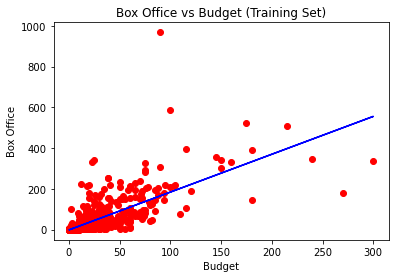

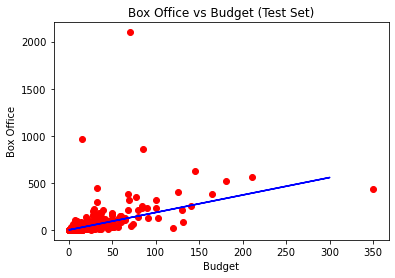

In [17]:
# Visualizing the Training set results

plt.scatter(x_train, y_train, color='red')
plt.plot(x_train, regressor.predict(x_train), color='blue')
plt.title('Box Office vs Budget (Training Set)')
plt.xlabel('Budget')
plt.ylabel('Box Office')

plt.show()

# Visualizing the Test set results

plt.scatter(x_test, y_test, color='red')
plt.plot(x_train, regressor.predict(x_train), color='blue')
plt.title('Box Office vs Budget (Test Set)')
plt.xlabel('Budget')
plt.ylabel('Box Office')

plt.show()

In [18]:
print(regressor.coef_)
print(regressor.intercept_)

[1.85897883]
-2.105431161469646


In [19]:
new = df["actors"].str.split("|", n = 1, expand = True)
df["LeadActor"] = new[0]

In [20]:
df

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,release_date,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3,LeadActor
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,...,11 January 2019 (USA),25.00,342.06,4,None,Vicky Kaushal,Action,Drama,War,Vicky Kaushal
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,11 January 2019 (USA),18.00,22.65,0,None,Anupam Kher,Biography,Drama,None,Anupam Kher
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,...,18 January 2019 (USA),20.00,10.54,0,None,Emraan Hashmi,Crime,Drama,None,Emraan Hashmi
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,...,11 January 2019 (India),2.75,2.50,17,1,Mona Ambegaonkar,Drama,None,None,Mona Ambegaonkar
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,...,18 January 2019 (USA),0.50,0.10,3,5,Geetika Vidya Ohlyan,Drama,None,None,Geetika Vidya Ohlyan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4324,Samadhi (1950 film),tt0268614,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Samadhi_(1950_film),Samadhi,Samadhi,0,1950,165,Drama,...,NaN,NaN,NaN,0,None,Ashok Kumar,Drama,None,None,Ashok Kumar
4325,Sangram (1950 film),tt0244182,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sangram_(1950_film),Sangram,Sangram,0,1950,139,Drama,...,NaN,NaN,NaN,0,None,Ashok Kumar,Drama,None,None,Ashok Kumar
4326,Sargam (1950 film),tt0269826,NaN,https://en.wikipedia.org/wiki/Sargam_(1950_film),Melody,Sargam,0,1950,135,Drama|Family,...,4 February 1957 (Iran),NaN,NaN,0,None,Raj Kapoor,Drama,Family,None,Raj Kapoor
4327,Sheesh Mahal (1950 film),tt0243555,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sheesh_Mahal_(19...,Sheesh Mahal,Sheesh Mahal,0,1950,144,Drama,...,NaN,NaN,NaN,0,None,Sohrab Modi,Drama,None,None,Sohrab Modi


# Enumerating Lead Actors

In [21]:
d = {df.LeadActor.unique()[i] : i for i in range(len(df.LeadActor.unique()))}
d

{'Vicky Kaushal': 0,
 'Anupam Kher': 1,
 'Emraan Hashmi': 2,
 'Mona Ambegaonkar': 3,
 'Geetika Vidya Ohlyan': 4,
 'Arshad Warsi': 5,
 'Radhika Apte': 6,
 'Kangana Ranaut': 7,
 'Nawazuddin Siddiqui': 8,
 'Ali Asgar': 9,
 'Ranveer Singh': 10,
 'Prit Kamani': 11,
 'Ajay Devgn': 12,
 'Sushant Singh Rajput': 13,
 'Amitabh Bachchan': 14,
 'Abhimanyu Dasani': 15,
 'Talha Arshad Reshi': 16,
 'Garima Agarwal': 17,
 'Rasika Agashe': 18,
 'Akshay Kumar': 19,
 'Zaheer Iqbal': 20,
 'Vidyut Jammwal': 21,
 'Deepika Amin': 22,
 'Manav Kaul': 23,
 'Naseeruddin Shah': 24,
 'Varun Dhawan': 25,
 'Shreyas Talpade': 26,
 'Tiger Shroff': 27,
 'Boman Irani': 28,
 'Arjun Kapoor': 29,
 'Gavie Chahal': 30,
 'Prabhu Deva': 31,
 'Shahid Kapoor': 32,
 'Ayushmann Khurrana': 33,
 'Karanvir Bohra': 34,
 'Hrithik Roshan': 35,
 'Jimmy Sheirgill': 36,
 'John Abraham': 37,
 'Rishi Kapoor': 38,
 'Natalia Janoszek': 39,
 'Diljit Dosanjh': 40,
 'Sidharth Malhotra': 41,
 'Rajeev Khandelwal': 42,
 'Zaira Wasim': 43,
 'Jacqueli

In [22]:
actor_list = list(d.items())
actor_list1 = np.array(actor_list).reshape(-1,2)
actor_list1

array([['Vicky Kaushal', '0'],
       ['Anupam Kher', '1'],
       ['Emraan Hashmi', '2'],
       ...,
       ['Suraiya', '942'],
       ['Anjali Devi', '943'],
       ['Cuckoo', '944']], dtype='<U26')

In [23]:
df["NumLeadActor"] = [d[i] for i in df['LeadActor']]
df.head(40)

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3,LeadActor,NumLeadActor
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,...,25.00,342.060,4,None,Vicky Kaushal,Action,Drama,War,Vicky Kaushal,0
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,18.00,22.650,0,None,Anupam Kher,Biography,Drama,None,Anupam Kher,1
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,...,20.00,10.540,0,None,Emraan Hashmi,Crime,Drama,None,Emraan Hashmi,2
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,...,2.75,2.500,17,1,Mona Ambegaonkar,Drama,None,None,Mona Ambegaonkar,3
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,...,0.50,0.100,3,5,Geetika Vidya Ohlyan,Drama,None,None,Geetika Vidya Ohlyan,4
6,Fraud Saiyaan,tt5013008,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Fraud_Saiyaan,Fraud Saiyaan,Fraud Saiyyan,0,2019,109,Comedy|Drama,...,25.00,1.000,0,None,Arshad Warsi,Comedy,Drama,None,Arshad Warsi,5
7,Bombairiya,tt4971258,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Bombairiya,Bombairiya,Bombairiya,0,2019,104,Comedy|Crime|Drama,...,5.50,0.500,0,None,Radhika Apte,Comedy,Crime,Drama,Radhika Apte,6
8,Manikarnika: The Queen of Jhansi,tt6903440,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Manikarnika:_The...,Manikarnika: The Queen of Jhansi,Manikarnika: The Queen of Jhansi,0,2019,148,Action|Biography|Drama,...,70.00,152.000,0,None,Kangana Ranaut,Action,Biography,Drama,Kangana Ranaut,7
9,Thackeray (film),tt7777196,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Thackeray_(film),Thackeray,Thackeray,0,2019,120,Biography|Drama,...,30.00,31.600,0,None,Nawazuddin Siddiqui,Biography,Drama,None,Nawazuddin Siddiqui,8
10,Amavas,tt8396186,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Amavas,Amavas,Amavas,0,2019,134,Horror|Thriller,...,2.00,3.700,0,None,Ali Asgar,Horror,Thriller,None,Ali Asgar,9


In [24]:
df[df["NumLeadActor"] == 1]

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3,LeadActor,NumLeadActor
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,18.00,22.65,0,None,Anupam Kher,Biography,Drama,None,Anupam Kher,1
38,One Day: Justice Delivered,tt8130558,https://upload.wikimedia.org/wikipedia/en/f/f7...,https://en.wikipedia.org/wiki/One_Day:_Justice...,One Day: Justice Delivered,One Day: Justice Delivered,0,2019,124,Action|Crime|Thriller,...,10.00,4.68,0,None,Anupam Kher,Action,Crime,Thriller,Anupam Kher,1
386,Dirty Politics (film),tt4501576,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Dirty_Politics_(...,Dirty Politics,Dirty Politics,0,2015,130,Drama,...,11.00,8.48,0,None,Anupam Kher,Drama,None,None,Anupam Kher,1
523,Singham Returns,tt2309764,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Singham_Returns,Singham Returns,Singham Returns,0,2014,142,Action|Drama,...,105.00,216.56,1,1,Anupam Kher,Action,Drama,None,Anupam Kher,1
549,Ekkees Toppon Ki Salaami,tt3847072,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Ekkees_Toppon_Ki...,Ekkees Toppon Ki Salaami,Ekkees Toppon Ki Salaami,0,2014,140,Comedy,...,7.50,1.91,0,None,Anupam Kher,Comedy,None,None,Anupam Kher,1
609,Hum Hai Raahi Car Ke,tt2100543,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Hum_Hai_Raahi_CA...,Hum Hai Raahi CAR Ke,Hum Hai Raahi CAR Ke,0,2013,137,Comedy|Romance,...,0.63,0.03,0,None,Anupam Kher,Comedy,Romance,None,Anupam Kher,1
689,Mr. Bhatti on Chutti,tt1127220,https://upload.wikimedia.org/wikipedia/en/b/b1...,https://en.wikipedia.org/wiki/Mr._Bhatti_on_Ch...,Mr Bhatti on Chutti,Mr Bhatti on Chutti,0,2012,117,Comedy,...,7.00,0.03,0,None,Anupam Kher,Comedy,None,None,Anupam Kher,1
789,Sahi Dhandhe Galat Bande,tt1630282,NaN,https://en.wikipedia.org/wiki/Sahi_Dhandhe_Gal...,Sahi Dhandhe Galat Bande,Sahi Dhandhe Galat Bande,0,2011,119,Action|Comedy|Drama,...,7.50,0.96,0,None,Anupam Kher,Action,Comedy,Drama,Anupam Kher,1
979,Yeh Mera India,tt1002963,NaN,https://en.wikipedia.org/wiki/Yeh_Mera_India,Y.M.I. Yeh Mera India,Y.M.I. Yeh Mera India,0,2008,137,Crime|Drama|Thriller,...,NaN,NaN,1,None,Anupam Kher,Crime,Drama,Thriller,Anupam Kher,1
1042,Meerabai Not Out,tt1024852,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Meerabai_Not_Out,Meerabai Not Out,Meerabai Not Out,0,2008,154,Comedy|Drama|Romance,...,NaN,NaN,0,None,Anupam Kher,Comedy,Drama,Romance,Anupam Kher,1


In [25]:
df1 = df.loc[df['box office'].notnull()]

x = np.array(df1['NumLeadActor']).reshape(-1, 1).astype(float)
y = df1['box office']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 1/3, random_state=0)


x_train.shape, y_train.shape, x_test.shape, y_test.shape

((642, 1), (642,), (321, 1), (321,))

In [26]:
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [27]:
y_pred = regressor.predict(x_test)
print('Accuracy of linear regression classifier on test set : {:.9f} '.format(regressor.score(x_test, y_test)))

Accuracy of linear regression classifier on test set : 0.029803307 


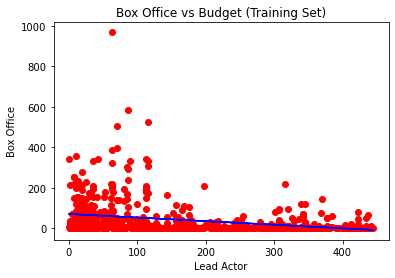

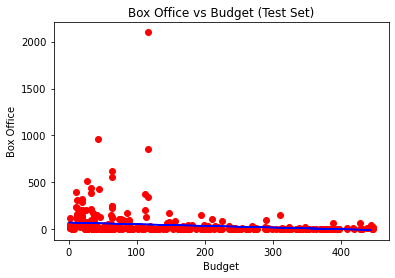

In [28]:
# Visualizing the Training set results

plt.scatter(x_train, y_train, color='red')
plt.plot(x_train, regressor.predict(x_train), color='blue')
plt.title('Box Office vs Budget (Training Set)')
plt.xlabel('Lead Actor')
plt.ylabel('Box Office')

plt.show()

# Visualizing the Test set results

plt.scatter(x_test, y_test, color='red')
plt.plot(x_train, regressor.predict(x_train), color='blue')
plt.title('Box Office vs Budget (Test Set)')
plt.xlabel('Budget')
plt.ylabel('Box Office')

plt.show()

# Award winning movies of leading bollywood actors across time

In [29]:
temp3 = winners[winners['lead_actor'].isin(temp2.actor.tolist())]
alt.Chart(temp3, title = 'Award winning Movies of Top Actors').mark_circle(opacity = 0.8).transform_window(
    id = 'rank()',
    groupby = ['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip = ['title', 'year', 'rating','genre'],
    color = 'lead_actor'
).properties(height=600, width=800)

alt.Chart(...)

# Most successfull actor in bollywood

In [30]:
movie_done_by_top_actor = df[df['lead_actor'].isin(temp3.lead_actor.tolist())]
success_percentage = (temp3.lead_actor.value_counts() / movie_done_by_top_actor.lead_actor.value_counts() * 100).rename_axis('actor').reset_index(name = '% success')
alt.Chart(success_percentage, title='What is success percentage of top actors').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle =- 45)),
    alt.Y("% success")
).properties(width = 600)

alt.Chart(...)

In [31]:
df1

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3,LeadActor,NumLeadActor
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,...,25.00,342.06,4,None,Vicky Kaushal,Action,Drama,War,Vicky Kaushal,0
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,18.00,22.65,0,None,Anupam Kher,Biography,Drama,None,Anupam Kher,1
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,...,20.00,10.54,0,None,Emraan Hashmi,Crime,Drama,None,Emraan Hashmi,2
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,...,2.75,2.50,17,1,Mona Ambegaonkar,Drama,None,None,Mona Ambegaonkar,3
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,...,0.50,0.10,3,5,Geetika Vidya Ohlyan,Drama,None,None,Geetika Vidya Ohlyan,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
969,Chandni Chowk to China,tt1091229,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Chandni_Chowk_to...,Chandni Chowk to China,Chandni Chowk to China,0,2009,154,Action|Comedy,...,80.00,120.00,1,3,Mithun Chakraborty,Action,Comedy,None,Mithun Chakraborty,345
970,Familywala,tt1353093,NaN,https://en.wikipedia.org/wiki/Familywala,Familywala,Familywala,0,2014,180,Comedy|Drama|Romance,...,6.00,3.00,0,None,Arjun Rampal,Comedy,Drama,Romance,Arjun Rampal,143
971,Sunglass (film),tt4249442,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sunglass_(2007_f...,Sunglass,Sunglass,0,2013,100,Comedy|Drama|Thriller,...,8.00,5.00,0,None,Jaya Bachchan,Comedy,Drama,Thriller,Jaya Bachchan,446
972,Sabse Bada Sukh,tt0069204,NaN,https://en.wikipedia.org/wiki/Sabse_Bada_Sukh,Sabse Bada Sukh,Sabse Bada Sukh,0,2018,100,Comedy|Drama,...,10.00,7.00,0,None,Vijay Arora,Comedy,Drama,None,Vijay Arora,447


In [32]:
temp4 = df.groupby(['year'])['runtime'].mean().reset_index(name = 'avg_runtime')
alt.Chart(temp4, title='Average runtime of movie over the years').mark_area(
    line={'color':'darkblue'},
    color=alt.Gradient(
        gradient = 'linear',
        stops=[alt.GradientStop(color='white', offset=0),
              alt.GradientStop(color='darkblue', offset=1)],
        x1 = 1,
        x2 = 1,
        y1 = 1,
        y2 = 0
    )
).encode(
    alt.X('year'),
    alt.Y('avg_runtime')
).properties(height=300, width=800)

alt.Chart(...)

It seems movie length have decreased by sweet 20-30 mins in five decades

# Apply TSA to predict average runtime of movies that will come in the future

In [33]:
temp_df = df[df['year'] >= 2009]
temp_df
new_df = temp_df['lead_actor'].value_counts()


In [34]:
new_df.head(30)

Akshay Kumar           28
Salman Khan            16
Amitabh Bachchan       15
Ajay Devgn             14
Emraan Hashmi          12
Ayushmann Khurrana     12
Sanjay Dutt            11
Rajkummar Rao          11
John Abraham           11
Manoj Bajpayee         11
Nawazuddin Siddiqui    10
Naseeruddin Shah       10
Shahid Kapoor          10
Saif Ali Khan          10
Kangana Ranaut         10
Ranbir Kapoor          10
Shah Rukh Khan          9
Ranveer Singh           9
Irrfan Khan             9
Jimmy Sheirgill         9
Anupam Kher             8
Hrithik Roshan          8
Vinay Pathak            8
Sunny Deol              8
Rishi Kapoor            8
Sidharth Malhotra       7
Varun Dhawan            7
Arshad Warsi            7
Neil Nitin Mukesh       7
Kartik Aaryan           7
Name: lead_actor, dtype: int64

In [35]:
temp_df

,title_x,imdb_id,poster_path,wiki_link,title_y,title,is_adult,year,runtime,genres,...,budget,box office,wins,nominations,lead_actor,genre,genre2,genre3,LeadActor,NumLeadActor
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,...,25.00,342.06,4,None,Vicky Kaushal,Action,Drama,War,Vicky Kaushal,0
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,...,18.00,22.65,0,None,Anupam Kher,Biography,Drama,None,Anupam Kher,1
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,...,20.00,10.54,0,None,Emraan Hashmi,Crime,Drama,None,Emraan Hashmi,2
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,...,2.75,2.50,17,1,Mona Ambegaonkar,Drama,None,None,Mona Ambegaonkar,3
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,...,0.50,0.10,3,5,Geetika Vidya Ohlyan,Drama,None,None,Geetika Vidya Ohlyan,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
969,Chandni Chowk to China,tt1091229,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Chandni_Chowk_to...,Chandni Chowk to China,Chandni Chowk to China,0,2009,154,Action|Comedy,...,80.00,120.00,1,3,Mithun Chakraborty,Action,Comedy,None,Mithun Chakraborty,345
970,Familywala,tt1353093,NaN,https://en.wikipedia.org/wiki/Familywala,Familywala,Familywala,0,2014,180,Comedy|Drama|Romance,...,6.00,3.00,0,None,Arjun Rampal,Comedy,Drama,Romance,Arjun Rampal,143
971,Sunglass (film),tt4249442,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sunglass_(2007_f...,Sunglass,Sunglass,0,2013,100,Comedy|Drama|Thriller,...,8.00,5.00,0,None,Jaya Bachchan,Comedy,Drama,Thriller,Jaya Bachchan,446
972,Sabse Bada Sukh,tt0069204,NaN,https://en.wikipedia.org/wiki/Sabse_Bada_Sukh,Sabse Bada Sukh,Sabse Bada Sukh,0,2018,100,Comedy|Drama,...,10.00,7.00,0,None,Vijay Arora,Comedy,Drama,None,Vijay Arora,447


In [36]:
temp_df['NumLeadActor'].corr(temp_df['box office'])

-0.23363460516250253

In [37]:
model = LinearRegression()  

In [38]:
x = np.array(df1['NumLeadActor']).reshape(-1, 1).astype(float)
y = df1['box office']

In [39]:
model.fit(x,y)

LinearRegression()

In [40]:
model = LinearRegression().fit(x, y)

In [41]:
r_sq = model.score(x, y)

In [42]:
print('coefficient of determination:', r_sq)

coefficient of determination: 0.054585128729438326


In [43]:
print('intercept:', model.intercept_)

intercept: 82.49422704329021


In [44]:
df.describe()

,is_adult,year,runtime,rating,votes,budget,box office,wins,NumLeadActor
count,4293.0,4293.000000,4293.000000,4293.000000,4293.000000,963.000000,963.000000,4293.000000,4293.000000
mean,0.0,1991.397158,140.936175,5.904496,2439.344048,25.041256,50.254131,1.203820,377.412998
std,0.0,18.139127,22.350135,1.328498,9593.590438,33.615699,116.614668,3.779595,286.572631
min,0.0,1950.000000,79.000000,0.000000,0.000000,0.070000,0.000800,0.000000,0.000000
25%,0.0,1977.000000,127.000000,5.100000,32.000000,5.250000,1.000000,0.000000,92.000000
50%,0.0,1993.000000,140.000000,6.100000,134.000000,14.000000,10.000000,0.000000,345.000000
75%,0.0,2007.000000,155.000000,6.900000,992.000000,30.000000,49.485000,1.000000,623.000000
max,0.0,2019.000000,321.000000,9.400000,310481.000000,350.000000,2100.000000,57.000000,944.000000


In [45]:
df1['summary']

0      Indian army special forces execute a covert op...
2      Explores Manmohan Singh's tenure as the Prime ...
3      The movie focuses on existing malpractices in ...
4      Under the 'Evening Shadows' truth often plays ...
5      While fighting crimes against women in Delhi a...
                             ...                        
969    An action-comedy about a simple cook from Chan...
970    A rich girl Anjali (Diya Mirza) arrives in Ind...
971    A satirical comedy about the seven-year itch b...
972    Village born Lalloo re-locates to Bombay and r...
973    Shinda tries robbing a bank so he can be wealt...
Name: summary, Length: 963, dtype: object

In [46]:
# we are going to use cosine similarity to find movies with similar plot
movie_recommend_df = df1[['title', 'summary']]
movie_recommend_df = movie_recommend_df.dropna(subset=['summary'])
movie_recommend_df = movie_recommend_df.reset_index(level=0)
movie_recommend_df['id'] = movie_recommend_df['index']
movie_recommend_df = movie_recommend_df.drop(['index'], axis=1)

tf = TfidfVectorizer(analyzer='word', min_df=1, max_features= 200 ,stop_words='english', lowercase=True)
tfidf_matrix = tf.fit_transform(movie_recommend_df['summary'])

cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)
results = {}

for idx, row in movie_recommend_df.iterrows():
    similar_indices = cosine_similarities[idx].argsort()[:-50:-1]
    similar_items = [(cosine_similarities[idx][i], movie_recommend_df['id'][i]) for i in similar_indices]
    results[row['id']] = similar_items[1:]

In [47]:
def item(id):
    return movie_recommend_df.loc[movie_recommend_df['id'] == id]['title']

def recommend(id, num):
    print("Recommending " + str(num) + " movie similar to " + item(id))
    recs = results[id][:num]
    i=0
    for rec in recs:
        print("We recommend : " + item(rec[1]) + " (score:" + str(rec[0]) + ")")

In [59]:
recommend(392,3)

389    Recommending 3 movie similar to Hunterrr
Name: title, dtype: object
801    We recommend : Ladies vs. Ricky Bahl (score:0....
Name: title, dtype: object
687    We recommend : Cocktail (score:0.5512422856556...
Name: title, dtype: object
303    We recommend : Dil Toh Deewana Hai (score:0.49...
Name: title, dtype: object


In [49]:
df1['title']

0           Uri: The Surgical Strike
2      The Accidental Prime Minister
3                    Why Cheat India
4                    Evening Shadows
5                               Soni
                   ...              
969           Chandni Chowk to China
970                       Familywala
971                         Sunglass
972                  Sabse Bada Sukh
973                            Daaka
Name: title, Length: 963, dtype: object

In [50]:
df1['story']

0      Divided over five chapters the film chronicles...
2      Based on the memoir by Indian policy analyst S...
3      The movie focuses on existing malpractices in ...
4      While gay rights and marriage equality has bee...
5      Soni a young policewoman in Delhi and her supe...
                             ...                        
969    Based in Delhi's Chandni Chowk orphaned Sidhu ...
970    A rich girl Anjali (Diya Mirza) arrives in Ind...
971    The film is a satirical comedy about the seven...
972    Village born Lalloo re-locates to Bombay and r...
973    Shinda tries robbing a bank so he can be wealt...
Name: story, Length: 963, dtype: object

In [51]:
#Import TfIdfVectorizer from scikit-learn
from sklearn.feature_extraction.text import TfidfVectorizer

#Define a TF-IDF Vectorizer Object. Remove all english stop words such as 'the', 'a'
tfidf = TfidfVectorizer(stop_words='english')

#Replace NaN with an empty string
df1['story'] = df1['story'].fillna('')

#Construct the required TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(df1['story'])

#Output the shape of tfidf_matrix
tfidf_matrix.shape

<ipython-input-51-598d61ce6899>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['story'] = df1['story'].fillna('')


(963, 11017)

In [52]:
# Import linear_kernel
from sklearn.metrics.pairwise import linear_kernel

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [53]:
#Construct a reverse map of indices and movie titles
indices = pd.Series(df1.index, index=df1['title']).drop_duplicates()

In [54]:
# Function that takes in movie title as input and outputs most similar movies
def get_recommendations(title, cosine_sim=cosine_sim):
    # Get the index of the movie that matches the title
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:4]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return df1['title'].iloc[movie_indices]

In [56]:
get_recommendations('Fukrey')

682         Department
35            Khamoshi
523    Singham Returns
Name: title, dtype: object

In [ ]:
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [ ]:
indices=pd.Series(df1.index,index=df1['title'])
titles=df1['title']
def recommendations(title):
    idx = indices[title]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:4]
    movie_indices = [i[0] for i in sim_scores]
    return titles.iloc[movie_indices]

In [ ]:
recommendations('Fukrey Returns')